# Modelos de Difusión


El siguiente notebook está dividido en 2 secciones:

1. Introducción a diffusers, stable diffusion y sus distintos modos, y manipulación y customización de esta arquitectura.
2. Cuestionario de evaluación.

**La primera sección no es evaluada**, es de caracter opcional y su objetivo es demostrar cómo utilizar y manipular modelos generativos del estado del arte.



---

## ✨ ✨ Introducción a diffusers y Stable Diffusion ✨ ✨




[Diffusers](https://huggingface.co/docs/diffusers/index) es una libería desarrollada el 2022 por HuggingFace, que busca facilitar y estandarizar el acceso al estado del arte de modelos de difusión.

La librería cuenta con tres componentes lógicos:

1. Diffusion Pipelines (procesos de difusion).
2. Noise Schedulers (programadores de ruido).
3. Modelos pre-entrenados.

De manera general, un pipeline de difusión se refiere a una arquitectura de difusión (por ejemplo, Stable Difusion). Por otro lado, el scheduler de ruido maneja cómo se realiza el proceso de difusión dentro de una pipeline, lo cual influye en aspectos como la velocidad que toma hacer una imagen, o bien la calidad final de esta. Finalmente, un modelo pre-entrenado es simplemente una pipeline que ya fue entrenada, y en varios casos, también incluye o limita el número de schedulers disponibles.

### Accediendo a Stable Diffusion mediante diffusers

La primera arquitectura expuesta en diffusers fue Stable Diffusion, por lo que en la actualidad, cuenta con bastante soporte y utilidades para este modelo.

Así que no perdamos el tiempo y comencemos a jugar con él. 😊

#### Instalación de librerías necesarias

Comencemos instalando las librerías que utilizaremos.

In [ ]:
#%pip install --upgrade torch==2.5.1 torchvision==0.20.1 torchaudio==2.5.1
#%pip install --upgrade fastai
%pip install transformers accelerate xformers invisible_watermark mediapy torchsde
%pip install --upgrade diffusers
%pip uninstall -y torch torchvision
#%pip install torch torchvision
%pip install torch torchvision --index-url https://download.pytorch.org/whl/cu118
from diffusers import DiffusionPipeline
import mediapy as media
import torch
import gc

# utilizaremos esta funcion para no quedarnos sin memoria
def flush():
    gc.collect()
    torch.cuda.empty_cache()

Found existing installation: torch 2.6.0+cu118
Uninstalling torch-2.6.0+cu118:
  Successfully uninstalled torch-2.6.0+cu118
Found existing installation: torchvision 0.21.0+cu118
Uninstalling torchvision-0.21.0+cu118:
  Successfully uninstalled torchvision-0.21.0+cu118
Looking in indexes: https://download.pytorch.org/whl/cu118
  Using cached https://download.pytorch.org/whl/cu118/torch-2.6.0%2Bcu118-cp311-cp311-linux_x86_64.whl.metadata (27 kB)
  Using cached https://download.pytorch.org/whl/cu118/torchvision-0.21.0%2Bcu118-cp311-cp311-linux_x86_64.whl.metadata (6.1 kB)
Using cached https://download.pytorch.org/whl/cu118/torch-2.6.0%2Bcu118-cp311-cp311-linux_x86_64.whl (848.7 MB)
Using cached https://download.pytorch.org/whl/cu118/torchvision-0.21.0%2Bcu118-cp311-cp311-linux_x86_64.whl (6.5 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastai 2.7.18 requir

#### Stable Diffusion 101

Ahora que instalamos las librerías necesarias, ¡generemos imágenes!

In [ ]:
pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda") # descargamos y cargamos nuestro pipeline

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

(…)ure_extractor%2Fpreprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

safety_checker%2Fconfig.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

""

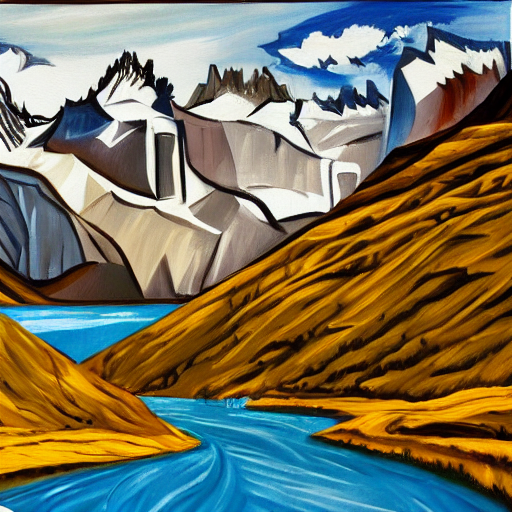

In [ ]:
generator = torch.Generator(device="cuda").manual_seed(42) # usaremos una seed para que todos veamos la misma imagen

prompt = "A painting of Torres del Paine in Picasso style" # descripción de la imagen a generar

images = pipeline(prompt, generator=generator).images # generamos una imagen y retornamos los resultados

media.show_images(images) # mostramos la imagen

Así de simple es generar una imagen. 🤯

Veamos qué involucró nuestro código:

- `DiffusionPipeline` es la clase de diffusers que permite acceder a una arquitectura.
- `from_pretrained` recibe un string indicando los pesos a cargar. Esto además informa a `DiffusionPipeline` que arquitectura será utilizada.
- `torch_dtype` informa qué representación de punto flotante queremos utilizar. Este modelo fue entrenado con una representación de `float32`, pero estamos bajando a `float16` dado que utiliza menos memoria en la GPU y la generación es más rápida. Existen incluso versiones de 8 y 4 bits.
- `pipeline("A painting of Torres del Paine in Picasso style")` genera la imagen condicionada con el texto _"A painting of Torres del Paine in Picasso style"_.

En esta ocasión, utilizamos la versión 1.5 de esta arquitectura, dado que es la que cuenta con más desarrollo de parte de la comunidad. Ojo que hace aproximadamente un mes salió Stable Diffusion XL, la cual es bastante superior a esta versión. En caso de que quieran saber qué otros modelos pre-entrenados existen, diffusers presenta [éste indice](https://huggingface.co/models).

Veamos ahora los parametros de manipulación que presenta nuestra pipeline.

En primer lugar, cambiemos los pasos de inferencia.

  0%|          | 0/25 [00:00<?, ?it/s]

""

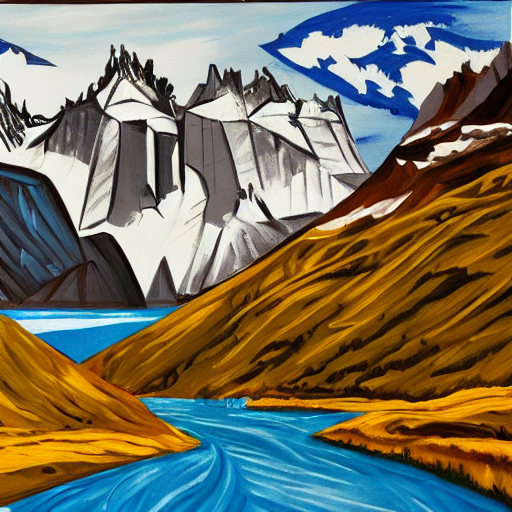

In [ ]:
def generate_image(steps, prompt=prompt):

  generator = torch.Generator(device="cuda").manual_seed(42)

  images = pipeline(prompt, generator=generator, num_inference_steps=steps).images

  media.show_images(images)

generate_image(steps=25)

Como podemos ver `num_inference_steps` determina la cantidad de pasos que realizará el proceso de difusión. Por default este modelo utiliza 50 pasos.

Veamos que ocurre si bajamos aún más la cantidad de pasos.

  0%|          | 0/5 [00:00<?, ?it/s]

""

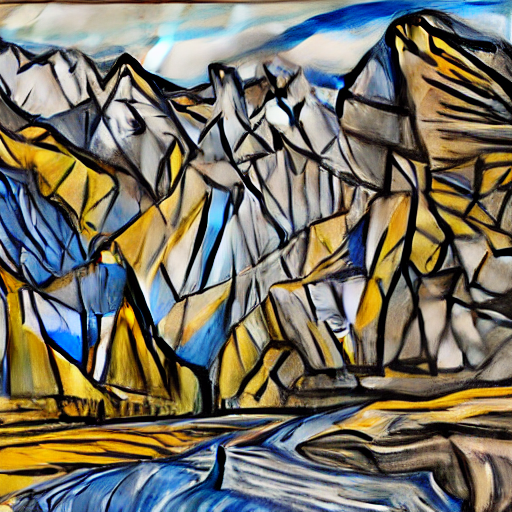

In [ ]:
generate_image(steps=5)

La imagen tomó mucho menos tiempo en generarse, pero bajó notoriamente su calidad.

¿Que ocurre si aumentamos la cantidad de pasos?

  0%|          | 0/100 [00:00<?, ?it/s]

""

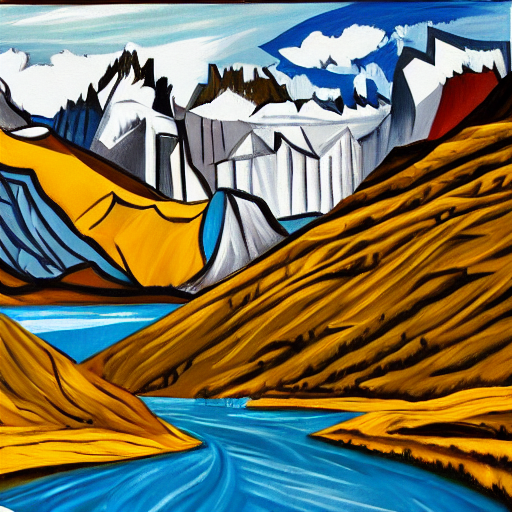

In [ ]:
generate_image(steps=100)

In [ ]:
generate_image(steps=200)

A medida que aumenta la cantidad de pasos, los detalles de la imagen final también aumentan (con prompts sobre imágenes más reales se nota mejor este efecto). De todas formas, esto tiene un límite y si bien uno puede poner numeros muy grandes de steps, la imagen final no mejorará mucho más que lo alcanzable entre 100-200 steps.

Probemos ahora los noise schedulers.

En primer lugar, veamos qué noise scheduler utiliza stable diffusion por default, y los schedulers compatibles.

In [ ]:
print("Stable Diffusion scheduler:", pipeline.scheduler)

print("listado de schedulers compatibles:")
for scheduler in pipeline.scheduler.compatibles:
  print(scheduler)

Stable Diffusion scheduler: PNDMScheduler {
  "_class_name": "PNDMScheduler",
  "_diffusers_version": "0.32.2",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "timestep_spacing": "leading",
  "trained_betas": null
}

listado de schedulers compatibles:
<class 'diffusers.schedulers.scheduling_pndm.PNDMScheduler'>
<class 'diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler'>
<class 'diffusers.schedulers.scheduling_lms_discrete.LMSDiscreteScheduler'>
<class 'diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler'>
<class 'diffusers.schedulers.scheduling_ddpm.DDPMScheduler'>
<class 'diffusers.schedulers.scheduling_dpmsolver_sde.DPMSolverSDEScheduler'>
<class 'diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler'>
<class 'diff

Probemos con 3 schedulers distintos.

  0%|          | 0/50 [00:00<?, ?it/s]

""

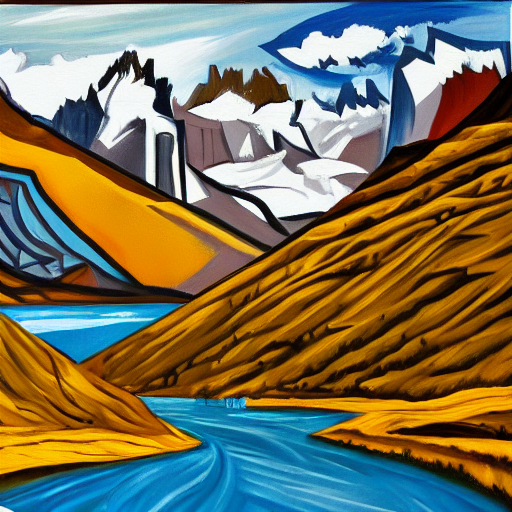

  0%|          | 0/50 [00:00<?, ?it/s]

""

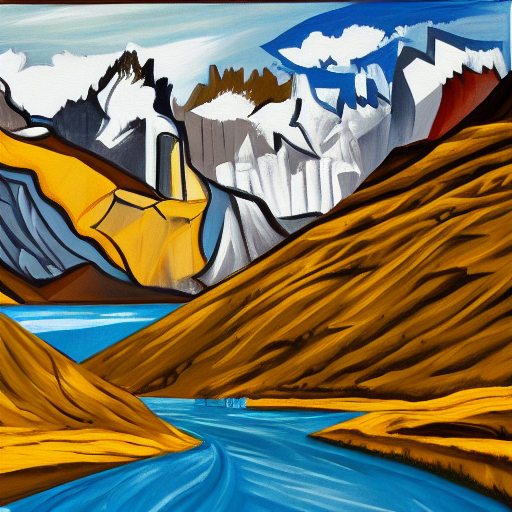

  0%|          | 0/50 [00:00<?, ?it/s]

""

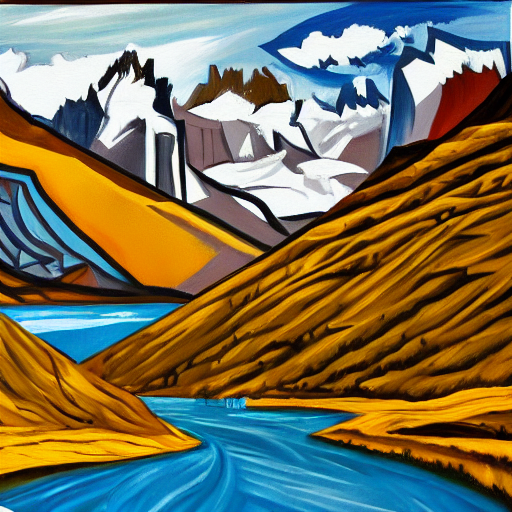

  0%|          | 0/50 [00:00<?, ?it/s]

""

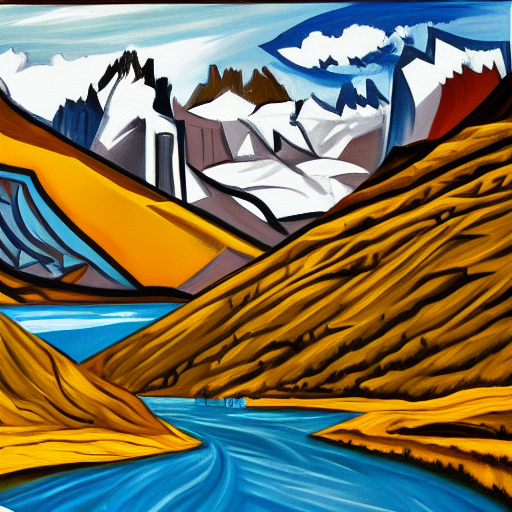

In [ ]:
from diffusers import LMSDiscreteScheduler, EulerDiscreteScheduler, KDPM2DiscreteScheduler, UniPCMultistepScheduler

def generate_image(scheduler, prompt=prompt):
  generator = torch.Generator(device="cuda").manual_seed(42)

  scheduler = scheduler.from_config(pipeline.scheduler.config)
  pipeline.scheduler = scheduler

  images = pipeline(prompt, generator=generator).images

  media.show_images(images)

generate_image(LMSDiscreteScheduler)
generate_image(EulerDiscreteScheduler)
generate_image(KDPM2DiscreteScheduler)
generate_image(UniPCMultistepScheduler)

Como podemos ver, cambia sutilmente los detalles según el sampler. Además, los tiempos de inferencia son distintos para cada samples. La pregunta obvia es, ¿cuál sampler utilizar?

En la práctica, es mejor probar distintos samplers según la imagen a generar, ya que son situacionales.

Por último, veamos la `guidance_scale`.

Guidance scale: 0


  0%|          | 0/20 [00:00<?, ?it/s]

""

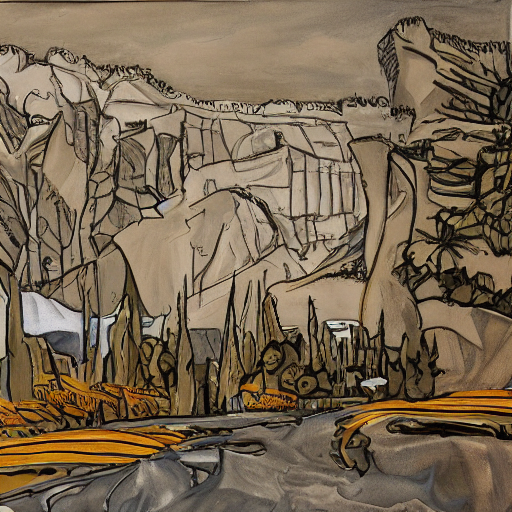

Guidance scale: 5


  0%|          | 0/20 [00:00<?, ?it/s]

""

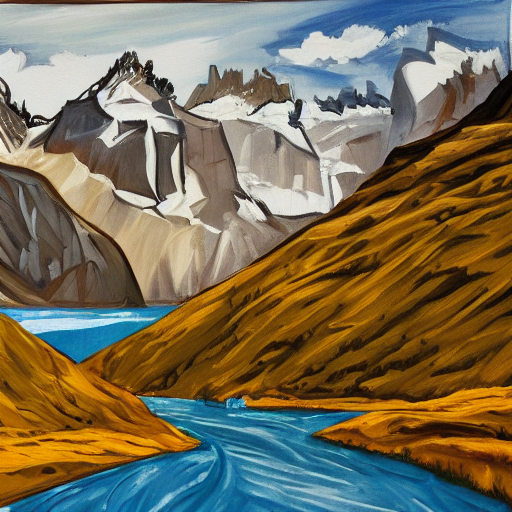

Guidance scale: 7.5


  0%|          | 0/20 [00:00<?, ?it/s]

""

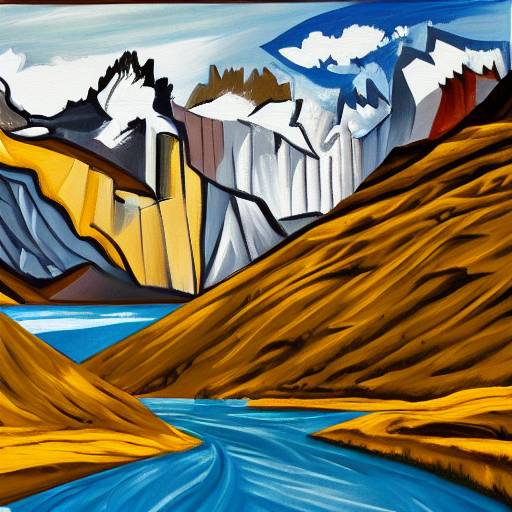

Guidance scale: 9


  0%|          | 0/20 [00:00<?, ?it/s]

""

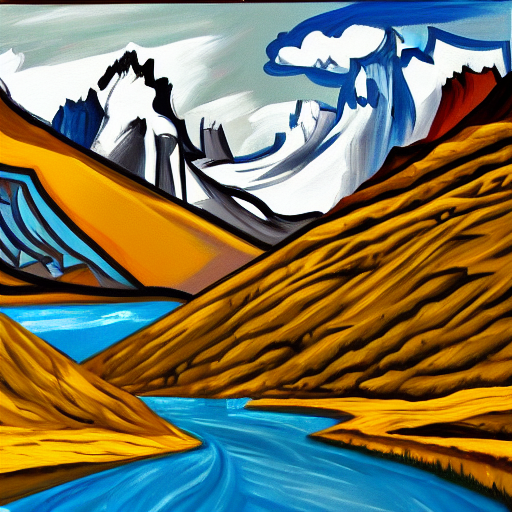

Guidance scale: 30


  0%|          | 0/20 [00:00<?, ?it/s]

""

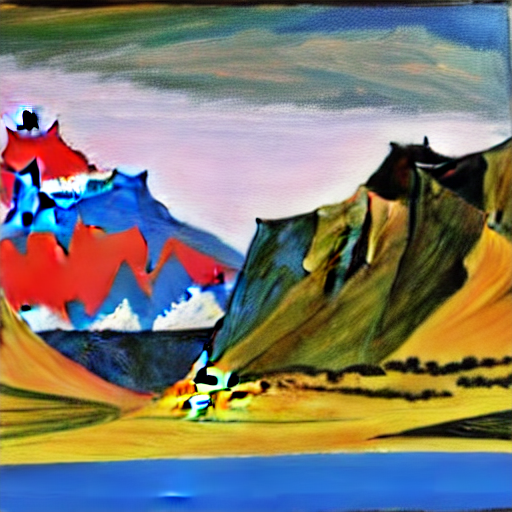

In [ ]:
def generate_image(guidance_scale, steps=20, prompt=prompt, scheduler=LMSDiscreteScheduler):
  generator = torch.Generator(device="cuda").manual_seed(42)

  scheduler = scheduler.from_config(pipeline.scheduler.config)
  pipeline.scheduler = scheduler

  images = pipeline(prompt, generator=generator, num_inference_steps=steps, guidance_scale=guidance_scale).images

  media.show_images(images)

for guidance_scale in [0, 5, 7.5, 9, 30]:
  print("Guidance scale:", guidance_scale)
  generate_image(guidance_scale=guidance_scale)


La `guidance_scale` controla la "libertad" que tiene el modelo al momento de generar una imagen dado un prompt. El valor estandar es 7.5, valores más bajos que estos implican que el modelo podrá "alejarse" con mayor libertad del contenido del prompt, mientras que valores altos, obligan al modelo a intentar replicar fielmente el "prompt".

#### Modos alternativos de Stable Diffusion

Ahora que tenemos una mayor comprensión de cómo utilizar stable diffusion, veamos pipelines alternativas creadas por la comunidad.

##### Img2Img

Img2img es un modo que permite condicionar la generación de una imagen con un prompt y otra imagen. Esto se logra agregando ruido a la imagen entregada, y quitando este ruido con el proceso condicionado mediante el texto entregado.

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline

del pipeline
flush() # borramos de la cache los experimentos anteriores

pipeline = StableDiffusionImg2ImgPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

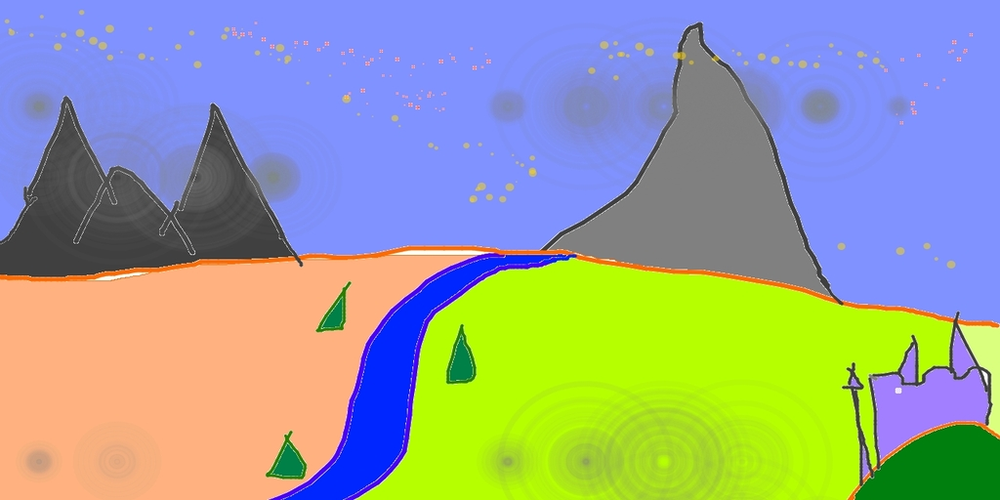

In [ ]:
from diffusers.utils import load_image

url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"

init_image = load_image(url)
init_image

  0%|          | 0/40 [00:00<?, ?it/s]

""

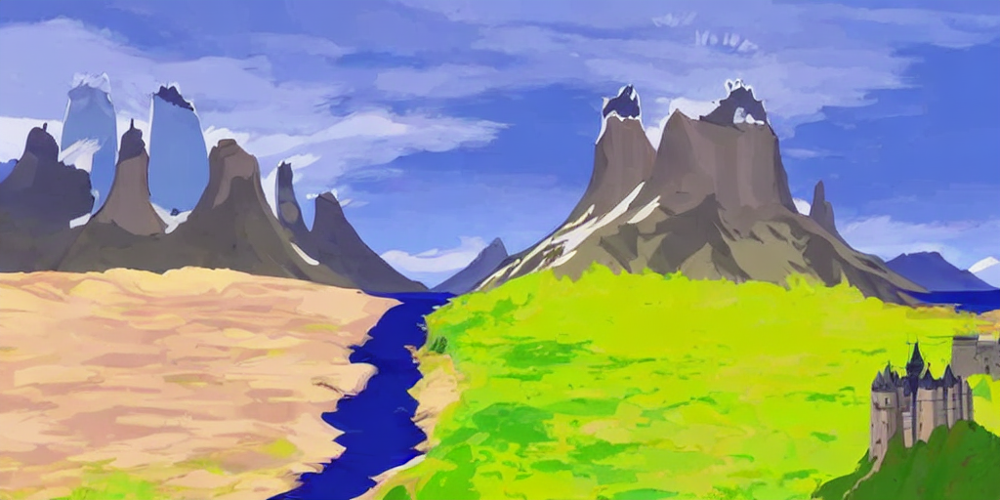

In [ ]:
prompt = "ghibli style, torres del paine with castles"
generator = torch.Generator(device="cuda").manual_seed(42)
images = pipeline(prompt, generator=generator, image=init_image).images

media.show_images(images)

##### Inpainting

Inpainting se parece a img2img, con la diferencia que sólo edita la sección enmascarada de la imagen original.

In [ ]:
from diffusers import StableDiffusionInpaintPipeline

del pipeline
flush()

pipeline = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=torch.float16,
).to("cuda")

model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

safety_checker%2Fconfig.json:   0%|          | 0.00/4.78k [00:00<?, ?B/s]

(…)ure_extractor%2Fpreprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


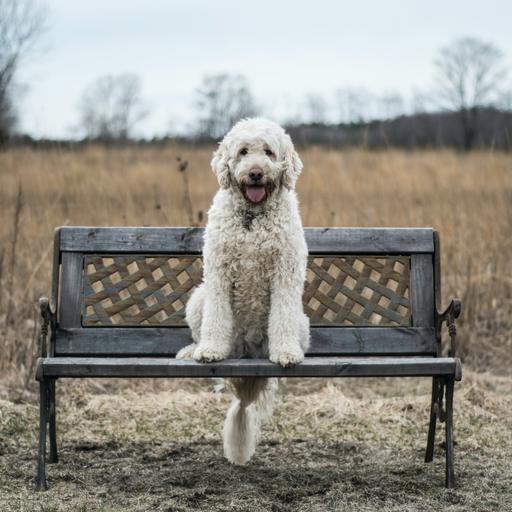

In [ ]:
img_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo.png"
mask_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png"

init_image = load_image(img_url).resize((512, 512))
mask_image = load_image(mask_url).resize((512, 512))

init_image

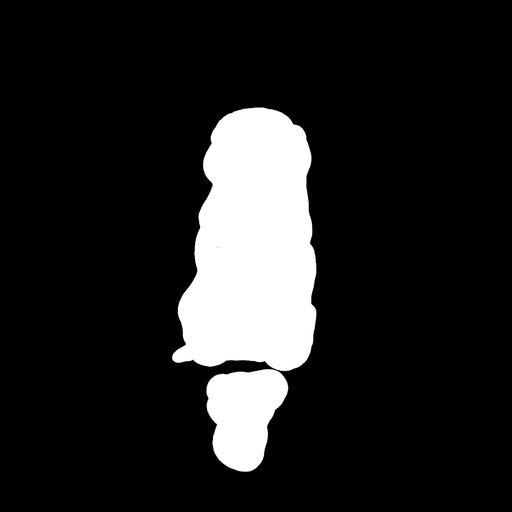

In [ ]:
mask_image

  0%|          | 0/50 [00:00<?, ?it/s]

""

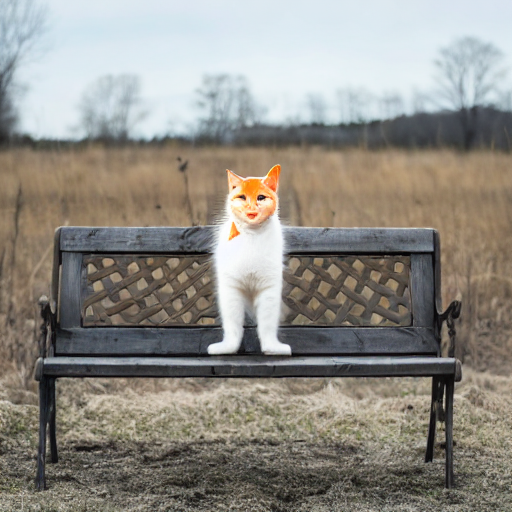

In [ ]:
prompt = "high resolution orange cat sitting on a park bench"
images = pipeline(prompt=prompt, image=init_image, mask_image=mask_image).images

media.show_images(images)

##### ControlNet

ControlNet es un sistema que permite condicionar la generación de una imágen en stable diffusion, mediante condicionantes aprendidos. En este caso, veremos cómo permite generar imágenes utilizando los ejes/contornos de otra imagen.

In [ ]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

del pipeline
flush()

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
pipeline = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16
).to("cuda")
pipeline.scheduler = UniPCMultistepScheduler.from_config(pipeline.scheduler.config)

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

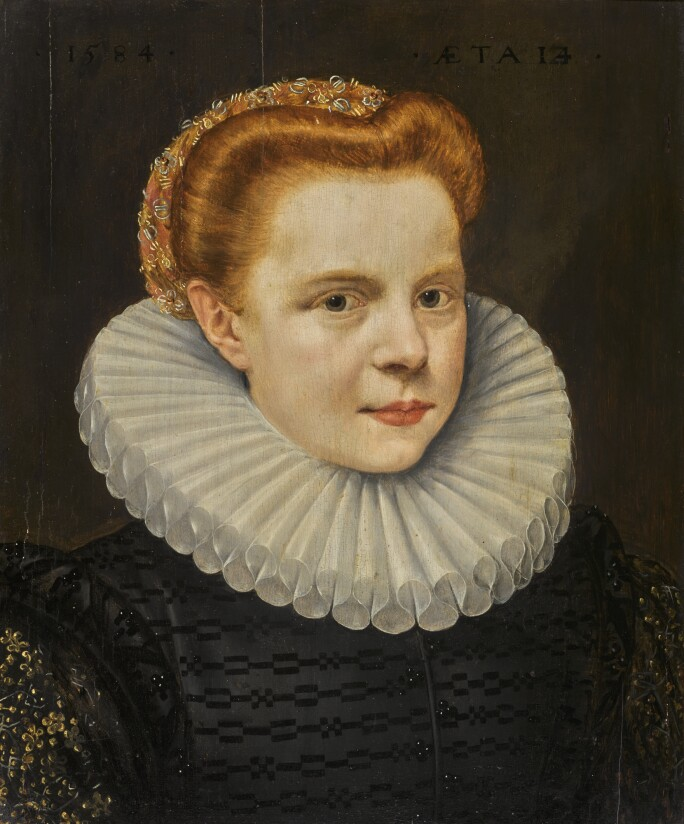

In [ ]:
image = load_image(
    "https://sothebys-com.brightspotcdn.com/dims4/default/57548a3/2147483647/strip/true/crop/1660x2000+0+0/resize/684x824!/quality/90/?url=http%3A%2F%2Fsothebys-brightspot.s3.amazonaws.com%2Fdotcom%2Fe3%2Ff7%2Ffa9d2912443a863bc07d4a1a8ee2%2Fomp-3ofakind-2.jpg"
)
image

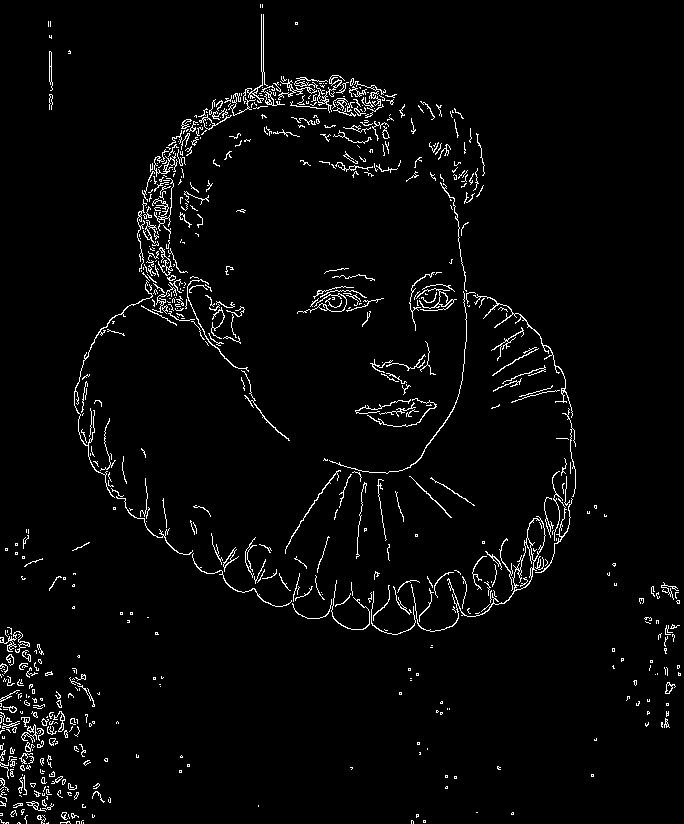

In [ ]:
import cv2
from PIL import Image
import numpy as np

image = np.array(image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
canny_image

In [ ]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

In [ ]:
prompt = ", best quality, extremely detailed"
prompt = [t + prompt for t in ["Gabriela Mistral", "Kim Kardashian", "rihanna", "taylor swift"]]

  0%|          | 0/20 [00:00<?, ?it/s]

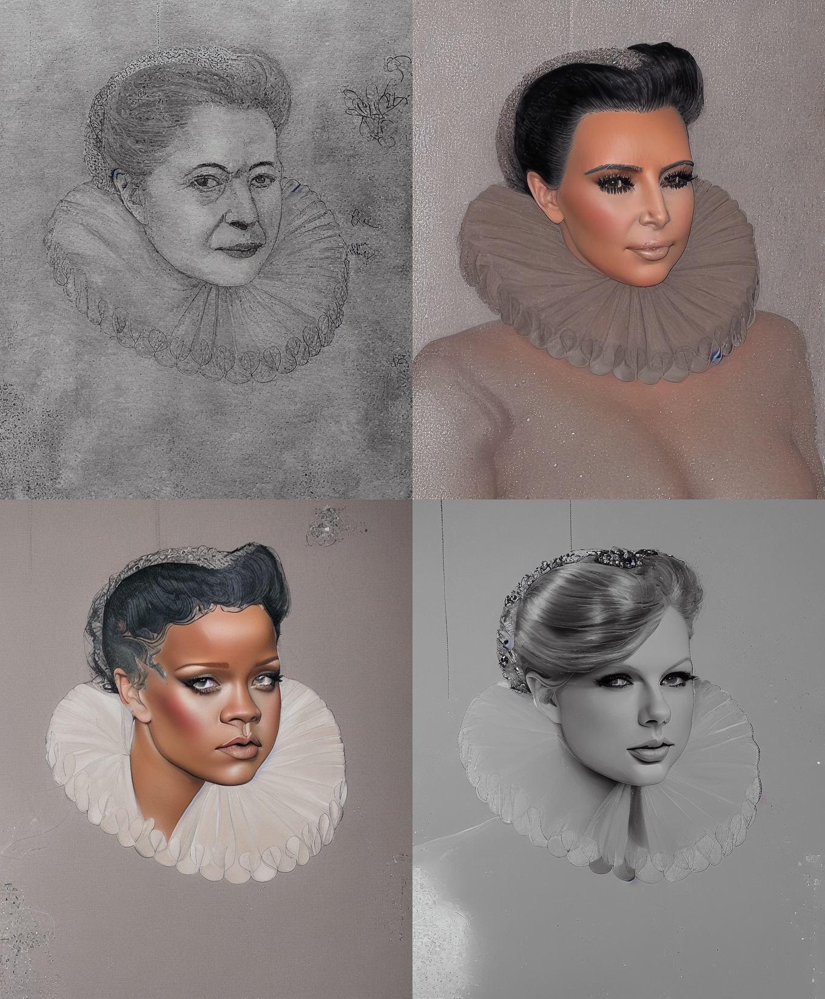

In [ ]:
output = pipeline(
    prompt,
    canny_image,
    num_inference_steps=20
)

image_grid(output.images, 2, 2)

## Cuestionario de evaluación


### Pregunta 1 (4 pts)

Explica el "*Generative learning trilemma*". Menciona cada uno de sus elementos, y caracteristicas comparativas.

### Pregunta 2 (4 pts)

Explique qué es la difusión latente. ¿Cuales son sus ventajas?


### Pregunta 3 (2 pts)
Explica cómo podrías utilizar modelos generativos en algún ámbito de tu trabajo. Justifique.

## Desafío

_Este desafío está pensado para aquellos que gustarían familiarizarse con el stack de tecnologías y problemas a resolver de un ML Engineer, por ende es 100% opcional y su recompensa será la experiencia adquirida._

Deployee Stable Diffusion en un endpoint de un servicio cloud. Lo anterior implica:

- Se puede hacer llamado a dicho endpoint enviando un prompt, ante lo cual se retornará la imagen generada.

Algunos tips para comenzar:

- Utilizar FastAPI para levantar el Backend (y crear el endpoint).
- Levantar una VM en GCP, que permita exponer el endpoint creado con FastAPI.